# This script includes: 

### 1. Import libraries
### 2. Import data
### 3. Filter dataset to three weather stations and years
### 4. Visualization of temperatures over time
### 5. Gradient descent for Gdansk (2022)
### 6. Gradient descent for Debilt (2021)
### 7. Gradient descent for Ljubljana (2020)



### 1. Import libraries

In [3]:
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import os
from mpl_toolkits import mplot3d

from plotly.offline import download_plotlyjs, init_notebook_mode
from plotly.offline import plot, iplot
import plotly.graph_objects as go

### 2. Import data

In [6]:
#Create a path to where your data is stored.
path = r'/Users/asadagha/Documents/CF Data Analytics/Machine Learning/Datasets'

In [8]:
#Read in the European weather data.
climate = pd.read_csv(os.path.join(path, 'Weather_Dataset_Scaled.csv'))
climate

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,19600101,1,6.5,3.7,2.4,9.3,10.0,0.8,10.6,7.9,-0.6,9.5,7.6,6.9,4.9,7.8,-5.9,4.2,10.0,8.5
1,19600102,1,6.1,2.9,2.3,7.7,8.2,1.6,6.1,7.7,2.1,8.6,9.8,6.2,3.4,12.2,-9.5,4.0,9.5,8.9
2,19600103,1,8.5,3.1,2.7,6.8,7.1,0.7,8.4,6.5,4.6,6.9,8.6,5.8,1.9,10.2,-9.5,2.4,10.3,10.5
3,19600104,1,6.3,2.0,2.0,6.7,6.8,-0.1,9.4,5.8,3.2,7.0,10.3,3.9,3.0,10.8,-11.5,1.2,11.2,7.4
4,19600105,1,3.0,2.0,2.5,8.0,7.7,0.4,8.9,5.4,3.6,8.1,12.1,1.8,3.7,9.9,-9.3,3.3,11.4,5.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,10,15.9,18.2,11.7,15.7,17.8,11.5,16.4,9.1,14.7,18.6,20.0,14.3,9.7,15.4,0.6,11.5,19.9,10.7
22946,20221028,10,16.7,15.9,11.7,16.0,19.4,11.7,15.8,9.1,12.9,18.9,19.1,16.1,10.9,15.4,2.3,12.5,20.3,10.7
22947,20221029,10,16.7,13.4,11.7,15.8,18.2,14.2,16.5,9.1,13.2,18.2,19.0,17.4,9.7,15.4,3.3,13.1,20.6,10.7
22948,20221030,10,15.4,15.0,11.7,14.4,16.7,11.0,15.2,9.1,14.0,16.3,15.7,14.5,5.9,15.4,3.4,7.5,15.9,10.7


In [10]:
#Reduce to just the mean temperatures
df = climate[['DATE', 'MONTH','BASEL_temp_mean',
 'BELGRADE_temp_mean',
 'BUDAPEST_temp_mean',
 'DEBILT_temp_mean',
 'DUSSELDORF_temp_mean',
 'GDANSK_temp_mean',
 'HEATHROW_temp_mean',
 'KASSEL_temp_mean',
 'LJUBLJANA_temp_mean',
 'MAASTRICHT_temp_mean',
 'MADRID_temp_mean',
 'MUNCHENB_temp_mean',
 'OSLO_temp_mean',
 'ROMA_temp_mean',
 'SONNBLICK_temp_mean',
 'STOCKHOLM_temp_mean',
 'TOURS_temp_mean',
 'VALENTIA_temp_mean']].copy()

In [12]:
df

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,19600101,1,6.5,3.7,2.4,9.3,10.0,0.8,10.6,7.9,-0.6,9.5,7.6,6.9,4.9,7.8,-5.9,4.2,10.0,8.5
1,19600102,1,6.1,2.9,2.3,7.7,8.2,1.6,6.1,7.7,2.1,8.6,9.8,6.2,3.4,12.2,-9.5,4.0,9.5,8.9
2,19600103,1,8.5,3.1,2.7,6.8,7.1,0.7,8.4,6.5,4.6,6.9,8.6,5.8,1.9,10.2,-9.5,2.4,10.3,10.5
3,19600104,1,6.3,2.0,2.0,6.7,6.8,-0.1,9.4,5.8,3.2,7.0,10.3,3.9,3.0,10.8,-11.5,1.2,11.2,7.4
4,19600105,1,3.0,2.0,2.5,8.0,7.7,0.4,8.9,5.4,3.6,8.1,12.1,1.8,3.7,9.9,-9.3,3.3,11.4,5.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,10,15.9,18.2,11.7,15.7,17.8,11.5,16.4,9.1,14.7,18.6,20.0,14.3,9.7,15.4,0.6,11.5,19.9,10.7
22946,20221028,10,16.7,15.9,11.7,16.0,19.4,11.7,15.8,9.1,12.9,18.9,19.1,16.1,10.9,15.4,2.3,12.5,20.3,10.7
22947,20221029,10,16.7,13.4,11.7,15.8,18.2,14.2,16.5,9.1,13.2,18.2,19.0,17.4,9.7,15.4,3.3,13.1,20.6,10.7
22948,20221030,10,15.4,15.0,11.7,14.4,16.7,11.0,15.2,9.1,14.0,16.3,15.7,14.5,5.9,15.4,3.4,7.5,15.9,10.7


In [14]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
nodate = df.drop(['DATE','MONTH'], axis=1)
nodate

,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,6.5,3.7,2.4,9.3,10.0,0.8,10.6,7.9,-0.6,9.5,7.6,6.9,4.9,7.8,-5.9,4.2,10.0,8.5
1,6.1,2.9,2.3,7.7,8.2,1.6,6.1,7.7,2.1,8.6,9.8,6.2,3.4,12.2,-9.5,4.0,9.5,8.9
2,8.5,3.1,2.7,6.8,7.1,0.7,8.4,6.5,4.6,6.9,8.6,5.8,1.9,10.2,-9.5,2.4,10.3,10.5
3,6.3,2.0,2.0,6.7,6.8,-0.1,9.4,5.8,3.2,7.0,10.3,3.9,3.0,10.8,-11.5,1.2,11.2,7.4
4,3.0,2.0,2.5,8.0,7.7,0.4,8.9,5.4,3.6,8.1,12.1,1.8,3.7,9.9,-9.3,3.3,11.4,5.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,15.9,18.2,11.7,15.7,17.8,11.5,16.4,9.1,14.7,18.6,20.0,14.3,9.7,15.4,0.6,11.5,19.9,10.7
22946,16.7,15.9,11.7,16.0,19.4,11.7,15.8,9.1,12.9,18.9,19.1,16.1,10.9,15.4,2.3,12.5,20.3,10.7
22947,16.7,13.4,11.7,15.8,18.2,14.2,16.5,9.1,13.2,18.2,19.0,17.4,9.7,15.4,3.3,13.1,20.6,10.7
22948,15.4,15.0,11.7,14.4,16.7,11.0,15.2,9.1,14.0,16.3,15.7,14.5,5.9,15.4,3.4,7.5,15.9,10.7


(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18]),
 [Text(1, 0, 'BASEL_temp_mean'),
  Text(2, 0, 'BELGRADE_temp_mean'),
  Text(3, 0, 'BUDAPEST_temp_mean'),
  Text(4, 0, 'DEBILT_temp_mean'),
  Text(5, 0, 'DUSSELDORF_temp_mean'),
  Text(6, 0, 'GDANSK_temp_mean'),
  Text(7, 0, 'HEATHROW_temp_mean'),
  Text(8, 0, 'KASSEL_temp_mean'),
  Text(9, 0, 'LJUBLJANA_temp_mean'),
  Text(10, 0, 'MAASTRICHT_temp_mean'),
  Text(11, 0, 'MADRID_temp_mean'),
  Text(12, 0, 'MUNCHENB_temp_mean'),
  Text(13, 0, 'OSLO_temp_mean'),
  Text(14, 0, 'ROMA_temp_mean'),
  Text(15, 0, 'SONNBLICK_temp_mean'),
  Text(16, 0, 'STOCKHOLM_temp_mean'),
  Text(17, 0, 'TOURS_temp_mean'),
  Text(18, 0, 'VALENTIA_temp_mean')])

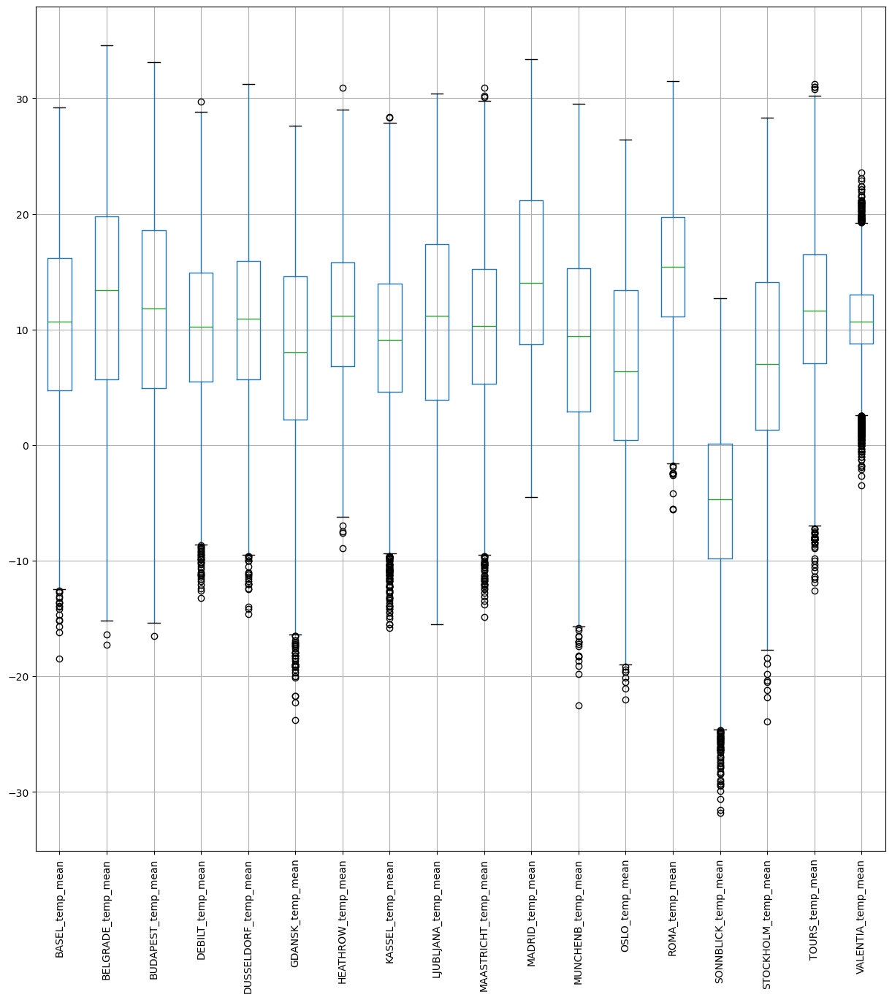

In [16]:
#Look at a whisker plot of the data to see variations in temperatures
nodate.boxplot(figsize=(15,15))
plt.xticks(rotation=90)

In [18]:
# Convert the 'DATE' column to datetime format
df['DATE'] = pd.to_datetime(df['DATE'], format='%Y%m%d')

### 3. Filter dataset to three weather stations and years

In [21]:
#reduce the dataset to a single year '2020'

# filter data for the year '2020'
#df[df['DATE'].astype(str).str.contains('2020')] #filters by all combinations
dfyear20 = df[df['DATE'].astype(str).str[:4] == '2020'] #filters by first 4 digits of #year [:4]
dfyear20

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
21915,2020-01-01,1,-0.4,2.0,3.8,0.8,1.3,2.3,4.9,9.1,-0.6,-0.6,6.6,0.8,1.9,15.4,-6.1,3.5,6.1,10.7
21916,2020-01-02,1,0.1,2.6,1.8,3.9,2.4,0.6,7.8,9.1,-2.7,3.5,6.0,-1.5,4.1,15.4,-5.4,5.8,9.0,10.7
21917,2020-01-03,1,5.3,0.7,-1.6,7.6,7.7,1.8,9.0,9.1,-1.0,7.5,3.8,3.5,4.5,15.4,-5.0,5.4,9.8,10.7
21918,2020-01-04,1,6.0,-0.6,2.7,6.7,5.1,3.7,5.6,9.1,1.6,5.0,7.0,4.3,0.7,15.4,-9.8,2.4,5.4,10.7
21919,2020-01-05,1,1.7,3.4,2.9,6.9,6.4,2.4,7.5,9.1,0.6,5.9,6.2,2.5,-0.1,15.4,-14.5,0.1,6.4,10.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,2020-12-27,12,1.7,2.7,0.1,5.0,4.8,0.1,6.2,9.1,-0.7,4.3,2.8,-2.1,2.9,15.4,-12.9,4.2,5.6,10.7
22277,2020-12-28,12,4.6,8.0,4.4,3.6,4.3,2.5,1.0,9.1,0.3,2.9,5.7,0.3,1.3,15.4,-13.1,4.2,4.4,10.7
22278,2020-12-29,12,4.4,11.5,8.8,3.7,1.5,4.3,2.4,9.1,2.9,2.1,4.5,2.8,2.3,15.4,-13.5,4.4,5.0,10.7
22279,2020-12-30,12,2.6,12.2,7.5,4.2,3.6,1.5,2.5,9.1,3.0,3.4,4.8,2.2,1.7,15.4,-13.8,2.8,4.5,10.7


In [23]:
dfyear20.describe()

,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,3.660000e+02,366.000000,366.000000,366.000000,366.000000,366.000000,3.660000e+02,366.000000,366.000000,366.000000,3.660000e+02
mean,6.513661,12.130874,14.347268,13.209016,11.688251,12.259016,9.977869,12.592350,9.100000e+00,12.129235,12.012295,16.009563,11.004098,8.711202,1.540000e+01,-3.292896,9.721311,13.676503,1.070000e+01
std,3.455958,6.883719,8.067950,7.852315,5.567863,6.151856,6.374270,5.576143,5.692123e-14,7.565281,6.089320,7.444140,6.963975,6.453667,5.336366e-14,6.072877,6.342113,5.879646,6.937275e-14
min,1.000000,-2.000000,-1.700000,-1.700000,0.600000,-0.200000,-2.400000,-0.900000,9.100000e+00,-2.700000,-1.400000,2.800000,-2.400000,-4.200000,1.540000e+01,-19.500000,-1.300000,1.800000,1.070000e+01
25%,4.000000,6.325000,7.725000,6.725000,7.300000,7.300000,4.725000,8.300000,9.100000e+00,5.400000,7.300000,10.200000,5.225000,3.500000,1.540000e+01,-7.050000,4.700000,9.000000,1.070000e+01
50%,7.000000,12.150000,14.750000,13.250000,11.500000,11.900000,9.150000,11.800000,9.100000e+00,12.450000,11.700000,14.250000,11.350000,7.350000,1.540000e+01,-3.350000,8.250000,13.700000,1.070000e+01
75%,9.750000,17.600000,21.350000,19.800000,15.700000,16.500000,15.475000,17.100000,9.100000e+00,18.350000,16.475000,22.325000,16.600000,13.575000,1.540000e+01,1.200000,14.975000,17.800000,1.070000e+01
max,12.000000,27.400000,29.800000,28.200000,27.000000,27.700000,24.000000,28.600000,9.100000e+00,26.700000,28.700000,32.200000,26.100000,24.600000,1.540000e+01,10.200000,24.700000,28.600000,1.070000e+01


In [25]:
#reduce the dataset to a single year '2021'

# filter data for the year '2021'
#df[df['DATE'].astype(str).str.contains('2021')] #filters by all combinations
dfyear21 = df[df['DATE'].astype(str).str[:4] == '2021'] #filters by first 4 digits of #year [:4]
dfyear21

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
22281,2021-01-01,1,2.2,6.9,11.7,3.0,2.3,-1.9,1.4,9.1,2.5,2.0,4.0,0.2,0.3,15.4,-13.3,3.0,2.1,10.7
22282,2021-01-02,1,1.4,7.8,11.7,3.6,2.6,-0.4,2.6,9.1,4.6,1.6,2.2,-1.1,0.9,15.4,-11.1,1.7,0.4,10.7
22283,2021-01-03,1,0.2,9.0,11.7,3.3,3.0,-0.1,3.3,9.1,3.6,2.1,3.0,-0.6,-1.4,15.4,-12.0,-0.2,2.3,10.7
22284,2021-01-04,1,0.6,8.1,11.7,2.8,2.1,0.7,4.0,9.1,3.4,1.5,2.7,-0.9,-3.0,15.4,-13.2,0.4,1.6,10.7
22285,2021-01-05,1,0.2,6.5,11.7,2.9,2.3,1.8,3.2,9.1,3.5,1.7,1.5,-1.3,-6.6,15.4,-14.5,-0.5,2.1,10.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22641,2021-12-27,12,6.6,1.4,11.7,5.6,6.5,-9.0,8.5,9.1,3.2,8.2,12.2,4.6,-8.5,15.4,-9.2,-3.9,11.4,10.7
22642,2021-12-28,12,10.3,2.7,11.7,8.8,8.7,-7.0,10.0,9.1,5.8,9.2,11.4,6.4,-5.0,15.4,-7.7,-0.1,11.8,10.7
22643,2021-12-29,12,9.6,5.2,11.7,9.5,9.7,-2.0,11.2,9.1,2.7,9.8,9.8,8.1,-5.9,15.4,-8.3,0.7,12.5,10.7
22644,2021-12-30,12,13.0,5.2,11.7,12.9,13.6,1.2,12.4,9.1,3.2,13.5,9.8,12.2,-0.6,15.4,-4.7,2.7,13.6,10.7


In [27]:
dfyear21.describe()

,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,365.000000,365.000000,365.000000,3.650000e+02,365.000000,365.000000,365.000000,365.000000,3.650000e+02,365.000000,365.000000,365.000000,365.000000,365.000000,3.650000e+02,365.000000,365.000000,365.000000,3.650000e+02
mean,6.526027,10.634795,13.794521,1.170000e+01,10.481096,10.811781,8.747123,11.696164,9.100000e+00,11.561918,10.564658,15.595616,9.731781,7.284384,1.540000e+01,-4.739452,8.140548,12.383014,1.070000e+01
std,3.452584,6.991232,8.857745,7.648819e-14,6.109086,6.624621,8.342610,5.785311,5.692145e-14,8.381400,6.428519,7.491199,7.369273,8.747785,5.336386e-14,7.020166,8.426847,6.281675,6.937301e-14
min,1.000000,-5.900000,-5.400000,1.170000e+01,-5.800000,-7.400000,-15.300000,-1.300000,9.100000e+00,-4.600000,-7.000000,-3.400000,-7.900000,-11.300000,1.540000e+01,-24.300000,-11.100000,-2.900000,1.070000e+01
25%,4.000000,4.900000,7.100000,1.170000e+01,5.700000,6.100000,2.200000,7.300000,9.100000e+00,4.900000,5.700000,10.000000,3.700000,1.700000,1.540000e+01,-9.400000,2.700000,7.500000,1.070000e+01
50%,7.000000,10.300000,12.300000,1.170000e+01,10.300000,10.300000,8.000000,11.200000,9.100000e+00,10.000000,10.000000,14.300000,9.300000,7.000000,1.540000e+01,-4.800000,7.500000,12.000000,1.070000e+01
75%,10.000000,16.900000,20.900000,1.170000e+01,16.300000,16.700000,16.100000,16.900000,9.100000e+00,18.500000,16.300000,21.000000,15.900000,15.200000,1.540000e+01,0.800000,14.900000,17.800000,1.070000e+01
max,12.000000,25.700000,32.600000,1.170000e+01,24.000000,28.100000,26.200000,24.900000,9.100000e+00,28.000000,26.300000,33.400000,25.800000,23.600000,1.540000e+01,10.100000,26.300000,25.100000,1.070000e+01


In [29]:
#reduce the dataset to a single year '2022'

# filter data for the year '2022'
#df[df['DATE'].astype(str).str.contains('2022')] #filters by all combinations
dfyear22 = df[df['DATE'].astype(str).str[:4] == '2022'] #filters by first 4 digits of #year [:4]
dfyear22

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
22646,2022-01-01,1,6.2,10.0,11.7,12.3,12.8,5.5,14.0,9.1,2.1,12.3,11.1,8.5,-2.3,15.4,-1.4,-0.3,9.5,10.7
22647,2022-01-02,1,6.4,11.5,11.7,11.7,11.4,6.8,11.4,9.1,1.4,11.6,9.8,9.5,0.3,15.4,0.0,2.6,11.0,10.7
22648,2022-01-03,1,11.3,9.7,11.7,9.7,9.7,7.4,9.8,9.1,5.2,9.1,9.7,10.3,1.1,15.4,-5.0,4.3,11.8,10.7
22649,2022-01-04,1,11.6,10.2,11.7,6.5,6.8,5.2,7.7,9.1,9.5,6.1,8.6,10.5,-2.6,15.4,-5.9,1.3,10.5,10.7
22650,2022-01-05,1,3.1,14.0,11.7,5.1,3.8,2.4,3.8,9.1,6.5,3.1,6.6,1.9,-2.4,15.4,-11.4,-1.7,4.1,10.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,2022-10-27,10,15.9,18.2,11.7,15.7,17.8,11.5,16.4,9.1,14.7,18.6,20.0,14.3,9.7,15.4,0.6,11.5,19.9,10.7
22946,2022-10-28,10,16.7,15.9,11.7,16.0,19.4,11.7,15.8,9.1,12.9,18.9,19.1,16.1,10.9,15.4,2.3,12.5,20.3,10.7
22947,2022-10-29,10,16.7,13.4,11.7,15.8,18.2,14.2,16.5,9.1,13.2,18.2,19.0,17.4,9.7,15.4,3.3,13.1,20.6,10.7
22948,2022-10-30,10,15.4,15.0,11.7,14.4,16.7,11.0,15.2,9.1,14.0,16.3,15.7,14.5,5.9,15.4,3.4,7.5,15.9,10.7


In [31]:
dfyear22.describe()

,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,304.000000,304.000000,304.000000,3.040000e+02,304.000000,304.000000,304.000000,304.000000,3.040000e+02,304.000000,304.000000,304.000000,304.000000,304.000000,3.040000e+02,304.000000,304.000000,304.000000,3.040000e+02
mean,5.526316,13.925000,16.249013,1.170000e+01,12.647039,13.518750,10.863816,13.931250,9.100000e+00,14.308224,13.209211,18.361513,12.723355,9.282566,1.540000e+01,-2.360855,10.134868,15.330263,1.070000e+01
std,2.875749,7.286855,8.576951,5.693714e-14,5.635243,6.428896,6.960327,5.816471,4.982000e-14,8.440408,6.412965,8.022456,7.380311,6.919508,1.067571e-14,6.945113,7.320294,6.786767,4.626143e-14
min,1.000000,-2.700000,-4.700000,1.170000e+01,1.700000,1.100000,-3.500000,1.200000,9.100000e+00,-3.900000,0.200000,3.800000,-2.500000,-6.000000,1.540000e+01,-18.700000,-6.000000,-2.000000,1.070000e+01
25%,3.000000,8.900000,9.700000,1.170000e+01,8.275000,8.675000,4.775000,9.275000,9.100000e+00,7.075000,8.675000,10.750000,7.000000,3.025000,1.540000e+01,-7.500000,3.500000,10.200000,1.070000e+01
50%,6.000000,14.650000,17.350000,1.170000e+01,12.650000,13.550000,11.200000,14.050000,9.100000e+00,14.250000,13.200000,19.150000,13.450000,10.100000,1.540000e+01,-1.400000,10.700000,15.750000,1.070000e+01
75%,8.000000,19.925000,23.350000,1.170000e+01,17.125000,18.700000,15.925000,18.100000,9.100000e+00,21.800000,18.250000,24.450000,18.825000,14.925000,1.540000e+01,3.300000,16.025000,20.725000,1.070000e+01
max,10.000000,28.700000,31.500000,1.170000e+01,26.900000,28.600000,26.800000,30.900000,9.100000e+00,30.400000,30.100000,33.400000,28.200000,22.600000,1.540000e+01,10.100000,25.400000,28.700000,1.070000e+01


### 4. Visualization of temperatures over time.

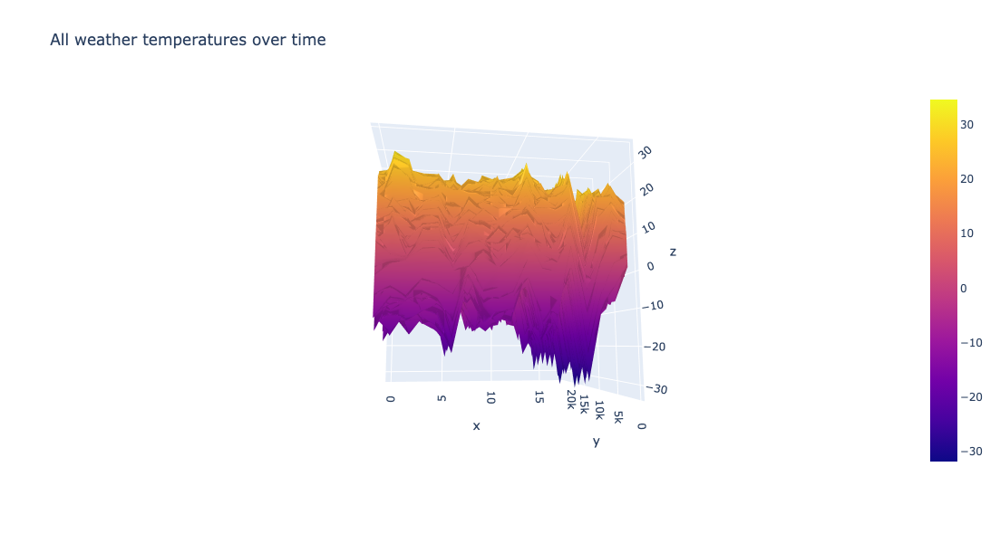

In [232]:
#plot ALL weather data for all stations (over time)

#X = weather stations
#Y = day of the year
#Z = temperature

#click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=nodate.values)])
fig.update_layout(title='All weather temperatures over time', autosize=False,
                  width=600, height=600)

### 5. Gradient descent for Gdansk (2022)

In [37]:
#drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempdate = dfyear22.drop(['DATE','MONTH'], axis=1)
notempdate

,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
22646,6.2,10.0,11.7,12.3,12.8,5.5,14.0,9.1,2.1,12.3,11.1,8.5,-2.3,15.4,-1.4,-0.3,9.5,10.7
22647,6.4,11.5,11.7,11.7,11.4,6.8,11.4,9.1,1.4,11.6,9.8,9.5,0.3,15.4,0.0,2.6,11.0,10.7
22648,11.3,9.7,11.7,9.7,9.7,7.4,9.8,9.1,5.2,9.1,9.7,10.3,1.1,15.4,-5.0,4.3,11.8,10.7
22649,11.6,10.2,11.7,6.5,6.8,5.2,7.7,9.1,9.5,6.1,8.6,10.5,-2.6,15.4,-5.9,1.3,10.5,10.7
22650,3.1,14.0,11.7,5.1,3.8,2.4,3.8,9.1,6.5,3.1,6.6,1.9,-2.4,15.4,-11.4,-1.7,4.1,10.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,15.9,18.2,11.7,15.7,17.8,11.5,16.4,9.1,14.7,18.6,20.0,14.3,9.7,15.4,0.6,11.5,19.9,10.7
22946,16.7,15.9,11.7,16.0,19.4,11.7,15.8,9.1,12.9,18.9,19.1,16.1,10.9,15.4,2.3,12.5,20.3,10.7
22947,16.7,13.4,11.7,15.8,18.2,14.2,16.5,9.1,13.2,18.2,19.0,17.4,9.7,15.4,3.3,13.1,20.6,10.7
22948,15.4,15.0,11.7,14.4,16.7,11.0,15.2,9.1,14.0,16.3,15.7,14.5,5.9,15.4,3.4,7.5,15.9,10.7


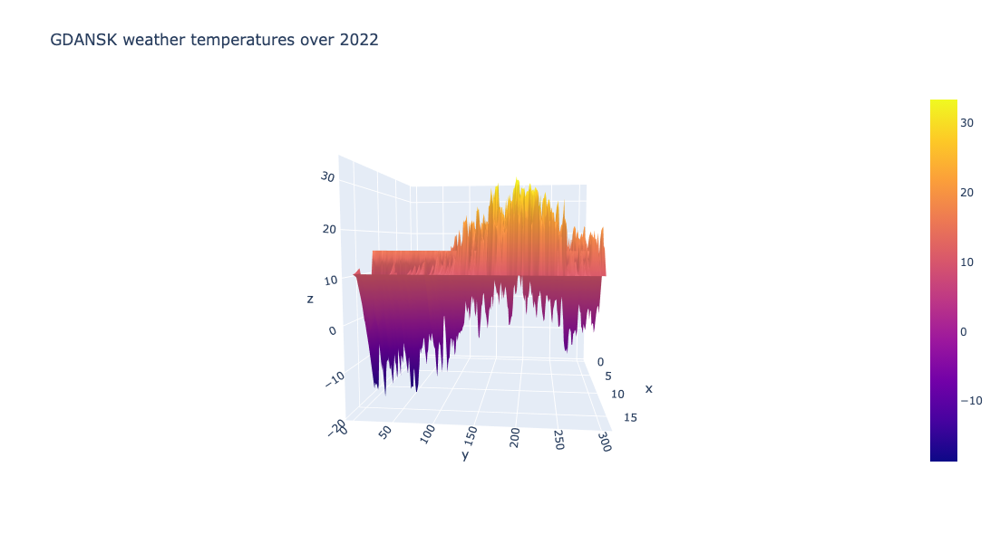

In [234]:
#plot ALL weather data for all stations (for a year)

#X = weather stations
#Y = day of the year
#Z = temperature

#click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=notempdate.values)])
fig.update_layout(title='GDANSK weather temperatures over 2022', autosize=False,
                  width=600, height=600)

In [41]:
n_rows = dfyear22.shape[0]
n_rows

304

In [43]:
#we need to make an index for the year. 
#creating a set of data from 1 to 304 instead of 365, as the dataset only contains 304 rows (or days)
#we'll scale this by 100 as the index is made.

i = np.arange(0.01,3.05,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
299,3.00
300,3.01
301,3.02
302,3.03


In [45]:
#this will translate our chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)

In [47]:
#represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear22['GDANSK_temp_mean'].to_numpy().reshape(n_rows,1) #<----chosen as it has the highest recorded mean temps from our 3D plot

In [49]:
X.shape, y.shape

((304, 2), (304, 1))

In [51]:
#look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear22['GDANSK_temp_mean'])
plt.xlabel('Day of year'); plt.ylabel('Temperature (MEAN)');
plt.title('GDANSK weather temperatures over 2022');

In [53]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
dfyear22['GDANSK_temp_mean'].min()

-3.5

In [55]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
dfyear22['GDANSK_temp_mean'].max()

26.8

In [57]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [59]:
compute_cost(X,y)

array([83.15463816])

In [61]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [63]:
%%time
# This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
# You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.05 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 154 ms, sys: 4.11 ms, total: 158 ms
Wall time: 155 ms


In [65]:
theta

array([[2.28190403],
       [5.62796826]])

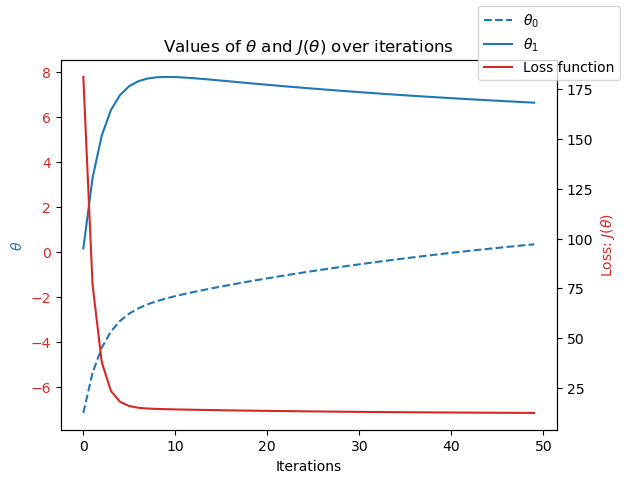

In [236]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();
plt.show()

In [69]:
%%time
# theta range
theta0_vals = np.linspace(-0.45,1,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-0.2,0.7,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: user 816 ms, sys: 30.5 ms, total: 847 ms
Wall time: 819 ms


In [238]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [240]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [242]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=500 #<---start with the same iterations as above
theta_init=np.array([[-0.2],[0]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.05 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

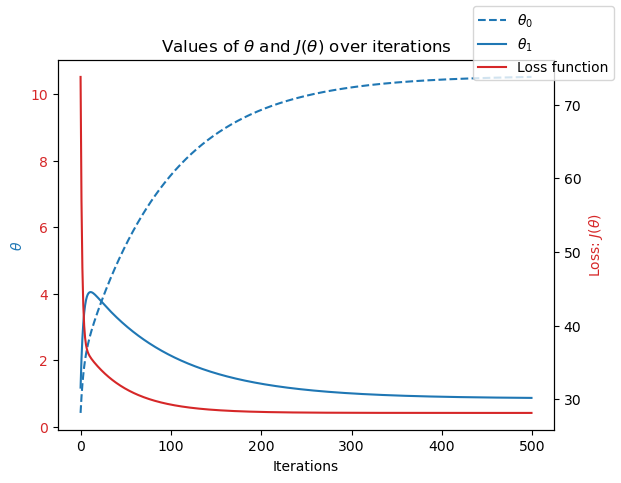

In [248]:
# This will plot your loss, theta0, and theta1.  If the result looks like a straight line, it's not converging on an answer!
# Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history1, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history1, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history1, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()

In [250]:
#plot ALL weather data for all stations (for a year)

#X = weather stations
#Y = day of the year
#Z = temperature

#click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=notempdate.values)])
fig.update_layout(title='GDANSK weather temperatures over 2022', autosize=False,
                  width=600, height=600)

In [81]:
n_rows = dfyear22.shape[0]
n_rows

304

In [83]:
#we need to make an index for the year. 
#creating a set of data from 1 to 304 instead of 365, as the dataset only contains 304 rows (or days)
#we'll scale this by 100 as the index is made.

i = np.arange(0.01,3.05,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
299,3.00
300,3.01
301,3.02
302,3.03


In [85]:
#this will translate our chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)

In [87]:
#represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear22['GDANSK_temp_mean'].to_numpy().reshape(n_rows,1) #<----chosen as it has the highest recorded mean temps from our 3D plot

In [89]:
X.shape, y.shape

((304, 2), (304, 1))

In [91]:
#look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear22['GDANSK_temp_mean'])
plt.xlabel('Day of year'); plt.ylabel('Temperature (MEAN)');
plt.title('GDANSK weather temperatures over 2022');

In [93]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
dfyear22['GDANSK_temp_mean'].min()

-3.5

In [95]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
dfyear22['GDANSK_temp_mean'].max()

26.8

In [97]:
#this computes the loss function for the gradiant descent.

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [99]:
compute_cost(X,y)

array([83.15463816])

In [101]:
#this is the gradiant descent function.

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimization technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [103]:
%%time
#this runs oour data through a gradiant descent for the starting conditions in 'theta_init.'
#adjust these numbers

num_iterations=50 #<---How many iterations needed. Start small and work up.
theta_init=np.array([[-10],[-5]]) #<---guess for [theta0], [theta1].
alpha=0.1 #<---Decide step size. Adjust iterations.
#If solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 33.1 ms, sys: 9.41 ms, total: 42.5 ms
Wall time: 55.5 ms


In [105]:
theta

array([[0.34775065],
       [6.64570123]])

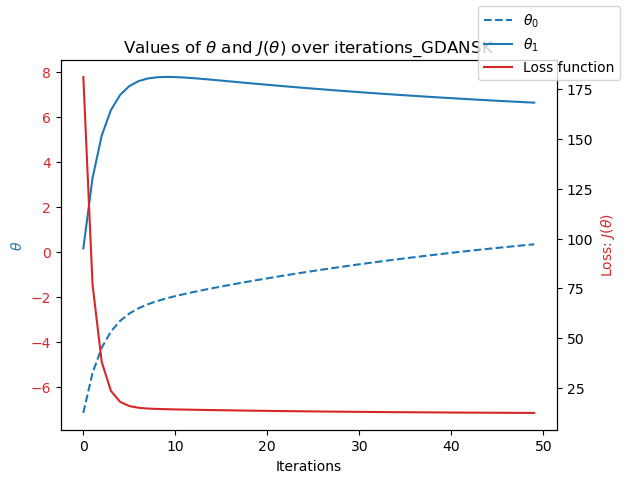

In [111]:
#this will plot our loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
#the loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations_GDANSK')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();
plt.show()

In [113]:
# find the minimum and maximum values of theta0 and theta1
theta0_min = min(theta0_history)
theta0_max = max(theta0_history)
theta1_min = min(theta1_history)
theta1_max = max(theta1_history)

print("Limits for theta0: ", theta0_min, "to", theta0_max)
print("Limits for theta1: ", theta1_min, "to", theta1_max)

Limits for theta0:  -7.151118421052631 to 0.3477506452732996
Limits for theta1:  0.163182565789473 to 7.790616365191055


In [115]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-10,10,100) #Put those values as the first two "linspace" numbers in these lines
                                      
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: user 811 ms, sys: 34 ms, total: 845 ms
Wall time: 815 ms


In [254]:
#this figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas_GDANSK', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')

In [252]:
#here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas_GDANSK', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')

In [127]:
#rerun the optimization above, but this time start closer to the objective!
#find where the black line ends near the lowest X/Y/Z coordinate and make that our guess below.

num_iterations=50 #<---start with the same iterations as above
theta_init=np.array([[2],[-3]]) #<---guess [x],[y] coordinates near the minimum in the graph above.
alpha= 0.1 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

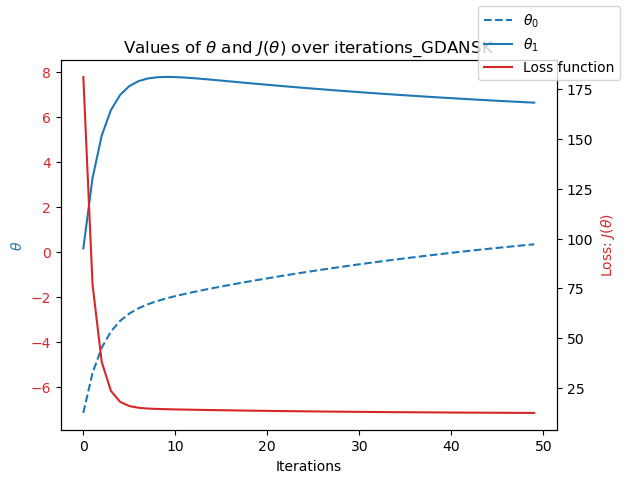

In [129]:
#this will plot our loss, theta0, and theta1. If the result looks like a straight line, it's not converging on an answer!
#the loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations_GDANSK')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();
plt.show()

In [258]:
#let's look at the new loss path on the function, it should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas_GDANSK', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')

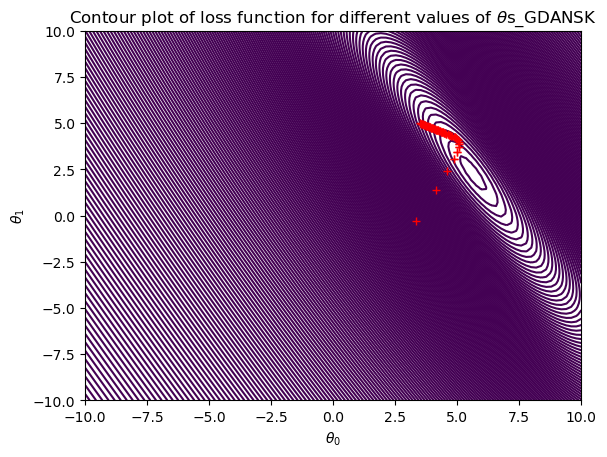

In [133]:
#shows the convergence similar to above, but only in the X/Y plane (there's no height)

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s_GDANSK");
plt.plot(theta0_history1, theta1_history1, 'r+');
plt.show()

### 6. Gradient descent for Debilt (2021)

In [135]:
#drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempdate1 = dfyear21.drop(['DATE','MONTH'], axis=1)
notempdate1

,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
22281,2.2,6.9,11.7,3.0,2.3,-1.9,1.4,9.1,2.5,2.0,4.0,0.2,0.3,15.4,-13.3,3.0,2.1,10.7
22282,1.4,7.8,11.7,3.6,2.6,-0.4,2.6,9.1,4.6,1.6,2.2,-1.1,0.9,15.4,-11.1,1.7,0.4,10.7
22283,0.2,9.0,11.7,3.3,3.0,-0.1,3.3,9.1,3.6,2.1,3.0,-0.6,-1.4,15.4,-12.0,-0.2,2.3,10.7
22284,0.6,8.1,11.7,2.8,2.1,0.7,4.0,9.1,3.4,1.5,2.7,-0.9,-3.0,15.4,-13.2,0.4,1.6,10.7
22285,0.2,6.5,11.7,2.9,2.3,1.8,3.2,9.1,3.5,1.7,1.5,-1.3,-6.6,15.4,-14.5,-0.5,2.1,10.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22641,6.6,1.4,11.7,5.6,6.5,-9.0,8.5,9.1,3.2,8.2,12.2,4.6,-8.5,15.4,-9.2,-3.9,11.4,10.7
22642,10.3,2.7,11.7,8.8,8.7,-7.0,10.0,9.1,5.8,9.2,11.4,6.4,-5.0,15.4,-7.7,-0.1,11.8,10.7
22643,9.6,5.2,11.7,9.5,9.7,-2.0,11.2,9.1,2.7,9.8,9.8,8.1,-5.9,15.4,-8.3,0.7,12.5,10.7
22644,13.0,5.2,11.7,12.9,13.6,1.2,12.4,9.1,3.2,13.5,9.8,12.2,-0.6,15.4,-4.7,2.7,13.6,10.7


In [256]:
#plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#click/hold in the graph below to rotate!

fig1 = go.Figure(data=[go.Surface(z=notempdate1.values)])
fig1.update_layout(title='DEBILT weather temperatures over 2021', autosize=False,
                  width=600, height=600)

In [139]:
n_rows1 = dfyear21.shape[0]
n_rows1

365

In [171]:
#make an index for the year. 
#create a set of data from 1 to 365 (days)
#scale it by 100 as the index is made.

i = np.arange(0.01,3.66,0.01) #<---one GREATER than the total number of days
index1 = pd.DataFrame(data = i, columns = ['index1'])
index1

,index1
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [173]:
#this will translate our chosen weather data into the X and y datasets needed for the optimization function.

X=index1.to_numpy().reshape(n_rows1,1)

In [175]:
#represent x_0 as a vector of 1s for vector computation
ones1 = np.ones((n_rows1,1))
X = np.concatenate((ones1, X), axis=1)
y=dfyear21['DEBILT_temp_mean'].to_numpy().reshape(n_rows1,1) #<----highest temp mean from our 3D plot

In [177]:
#look at one year of temperature data over time
plt.scatter(x=index1['index1'], y=dfyear21['DEBILT_temp_mean'])
plt.xlabel('Day of year'); plt.ylabel('Temperature (MEAN)');
plt.title('DEBILT Weather Temperature Mean in 2021');

In [179]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
dfyear21['DEBILT_temp_mean'].min()

-5.8

In [181]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
dfyear21['DEBILT_temp_mean'].max()

24.0

In [183]:
num_iterations=100 #<---use same iterations
theta_init=np.array([[2],[-3]]) #<---make a guess [x],[y]
alpha= 0.1 #<---use the same step size
theta2, J_history2, theta0_history2, theta1_history2 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

In [185]:
theta2

array([[7.02849271],
       [1.84837544]])

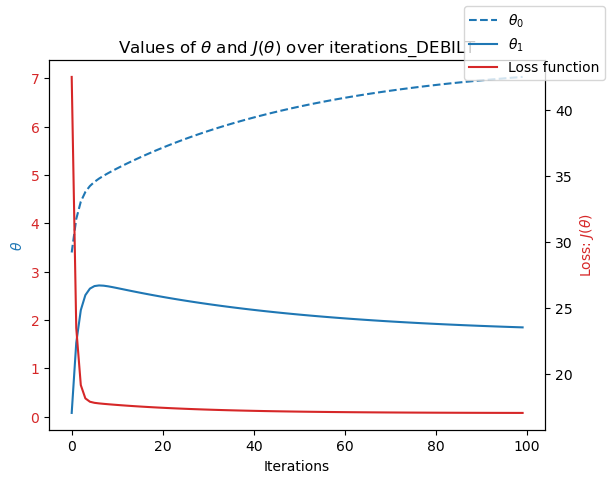

In [196]:
#this will plot the loss, theta0, and theta1.

fig1, ax2 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax2.plot(theta0_history2, label='$\\theta_{0}$', linestyle='--', color=color)
ax2.plot(theta1_history2, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax2.set_xlabel('Iterations'); ax2.set_ylabel('$\\theta$', color=color);
ax2.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax3 = ax2.twinx()
ax3.plot(J_history2, label='Loss function', color=color)
ax3.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations_DEBILT')
ax3.set_ylabel('Loss: $J(\\theta)$', color=color)
ax2.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig1.legend();
plt.show()

In [190]:
#this figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#find where it is closest to 0 in X and Y!

#click/hold in the graph below to rotate!

fig1 = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig1.update_layout(title='Loss function for different thetas_DEBILT', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')

In [192]:
#here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#find where it is closest to 0 in X and Y!

#click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig1 = go.Figure()
fig1.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig1.add_scatter3d(x=theta1_history2, y=theta0_history2, z=J_history2, line=line_marker, name='')
#the below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history2, theta1_history2, 'r+');
fig1.update_layout(title='Loss function for different thetas_DEBILT', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')

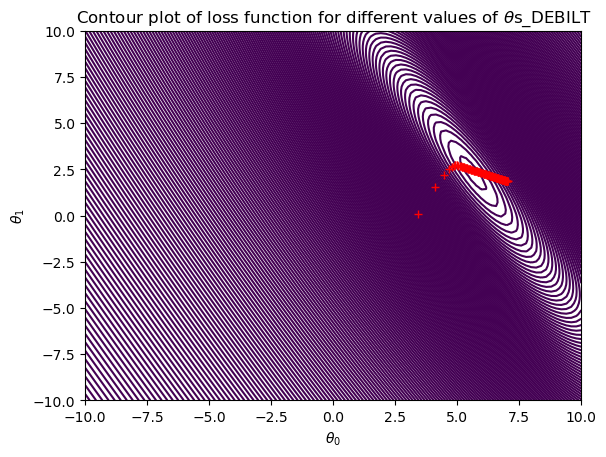

In [194]:
#plot shows the convergence

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s_DEBILT");
plt.plot(theta0_history2, theta1_history2, 'r+');
plt.show()

How well does gradient descent converge? 

- As noted, the convergence of the gradient descent algorithm appears to be relatively effective.

### 7. Gradient descent for Ljubljana (2020)

In [198]:
#drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempdate2 = dfyear20.drop(['DATE','MONTH'], axis=1)
notempdate2

,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
21915,-0.4,2.0,3.8,0.8,1.3,2.3,4.9,9.1,-0.6,-0.6,6.6,0.8,1.9,15.4,-6.1,3.5,6.1,10.7
21916,0.1,2.6,1.8,3.9,2.4,0.6,7.8,9.1,-2.7,3.5,6.0,-1.5,4.1,15.4,-5.4,5.8,9.0,10.7
21917,5.3,0.7,-1.6,7.6,7.7,1.8,9.0,9.1,-1.0,7.5,3.8,3.5,4.5,15.4,-5.0,5.4,9.8,10.7
21918,6.0,-0.6,2.7,6.7,5.1,3.7,5.6,9.1,1.6,5.0,7.0,4.3,0.7,15.4,-9.8,2.4,5.4,10.7
21919,1.7,3.4,2.9,6.9,6.4,2.4,7.5,9.1,0.6,5.9,6.2,2.5,-0.1,15.4,-14.5,0.1,6.4,10.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,1.7,2.7,0.1,5.0,4.8,0.1,6.2,9.1,-0.7,4.3,2.8,-2.1,2.9,15.4,-12.9,4.2,5.6,10.7
22277,4.6,8.0,4.4,3.6,4.3,2.5,1.0,9.1,0.3,2.9,5.7,0.3,1.3,15.4,-13.1,4.2,4.4,10.7
22278,4.4,11.5,8.8,3.7,1.5,4.3,2.4,9.1,2.9,2.1,4.5,2.8,2.3,15.4,-13.5,4.4,5.0,10.7
22279,2.6,12.2,7.5,4.2,3.6,1.5,2.5,9.1,3.0,3.4,4.8,2.2,1.7,15.4,-13.8,2.8,4.5,10.7


In [200]:
#plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#click/hold in the graph below to rotate!

fig2 = go.Figure(data=[go.Surface(z=notempdate2.values)])
fig2.update_layout(title='LJUBLJANA weather temperatures over 2020', autosize=False,
                  width=600, height=600)

In [202]:
n_rows2 = dfyear20.shape[0]
n_rows2

366

In [204]:
#make an index for the year. 
#create a set of data from 1 to 365 (days)
#scale it by 100 as the index is made.

i = np.arange(0.01,3.67,0.01) #<---one GREATER than the total number of days #LEAP YEAR
index2 = pd.DataFrame(data = i, columns = ['index2'])
index2

,index2
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [206]:
#this will translate our chosen weather data into the X and y datasets needed for the optimization function.

X=index2.to_numpy().reshape(n_rows2,1)

In [208]:
#represent x_0 as a vector of 1s for vector computation
ones2 = np.ones((n_rows2,1))
X = np.concatenate((ones2, X), axis=1)
y=dfyear20['LJUBLJANA_temp_mean'].to_numpy().reshape(n_rows2,1) #<----randomly chosen weather station

In [210]:
#look at one year of temperature data over time
plt.scatter(x=index2['index2'], y=dfyear20['LJUBLJANA_temp_mean'])
plt.xlabel('Day of year'); plt.ylabel('Temperature (MEAN)');
plt.title('LJUBLJANA weather temperatures over 2021');

In [212]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
dfyear20['LJUBLJANA_temp_mean'].min()

-2.7

In [214]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
dfyear20['LJUBLJANA_temp_mean'].max()

26.7

In [216]:
num_iterations=200 #<---use same iterations
theta_init=np.array([[2],[-3]]) #<---make a guess [x],[y]
alpha= 0.1 #<---use the same step size
theta3, J_history3, theta0_history3, theta1_history3 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

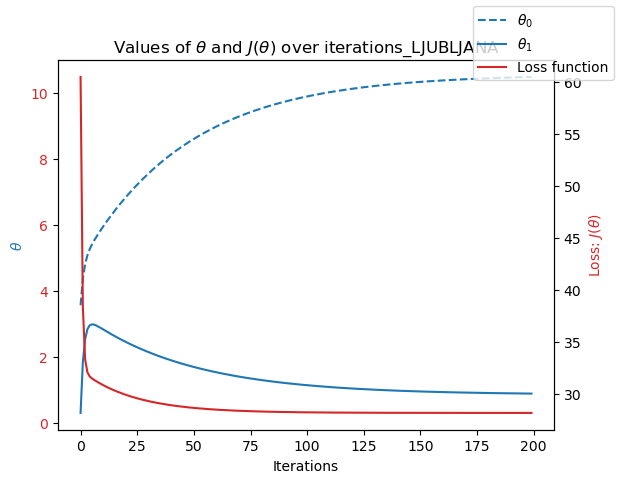

In [224]:
#This will plot the loss, theta0, and theta1.

fig2, ax3 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax3.plot(theta0_history3, label='$\\theta_{0}$', linestyle='--', color=color)
ax3.plot(theta1_history3, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax3.set_xlabel('Iterations'); ax3.set_ylabel('$\\theta$', color=color);
ax3.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax4 = ax3.twinx()
ax4.plot(J_history3, label='Loss function', color=color)
ax4.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations_LJUBLJANA')
ax4.set_ylabel('Loss: $J(\\theta)$', color=color)
ax3.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig2.legend();
plt.show()

In [226]:
#this figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#find where it is closest to 0 in X and Y!

#click/hold in the graph below to rotate!

fig2 = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig2.update_layout(title='Loss function for different thetas_LJUBLJANA', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')

In [228]:
#line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#find where it is closest to 0 in X and Y!

#click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig2 = go.Figure()
fig2.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig2.add_scatter3d(x=theta1_history3, y=theta0_history3, z=J_history3, line=line_marker, name='path of convergence')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history3, theta1_history3, 'r+');
fig2.update_layout(title='Loss function for different thetas_LJUBLJANA', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')

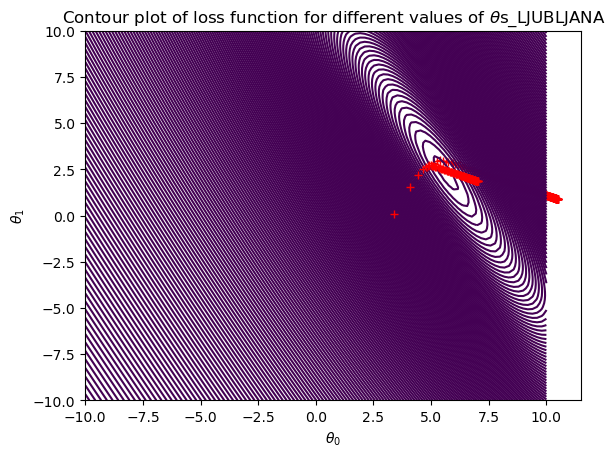

In [230]:
#show convergence

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s_LJUBLJANA");
plt.plot(theta0_history2, theta1_history2, 'r+');
plt.show()